# SIIM-ACR Pneumothorax Segmentation

### Identify Pneumothorax disease in chest x-rays

Pneumothorax can be caused by a blunt chest injury, damage from underlying lung disease, or most horrifying—it may occur for no obvious reason at all. On some occasions, a collapsed lung can be a life-threatening event.

First attempt solution, been working on this problem for two days. The core philosophy behind this approach is heavy augmentation, attaining a balanced class ratio (positive:negative diagnosis) for training and the use of Res-U-Net for inference.

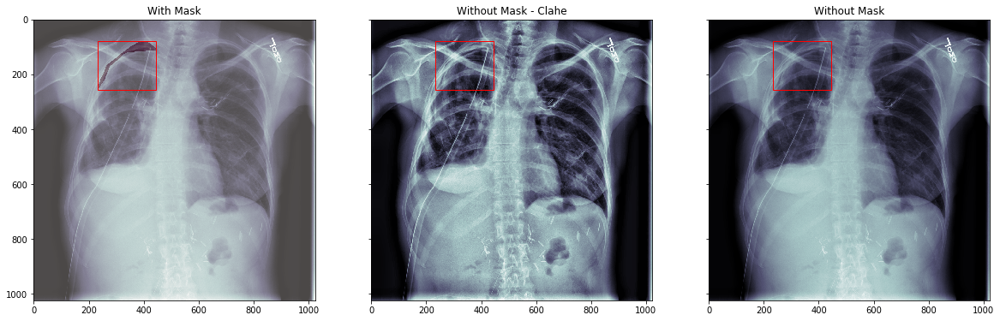
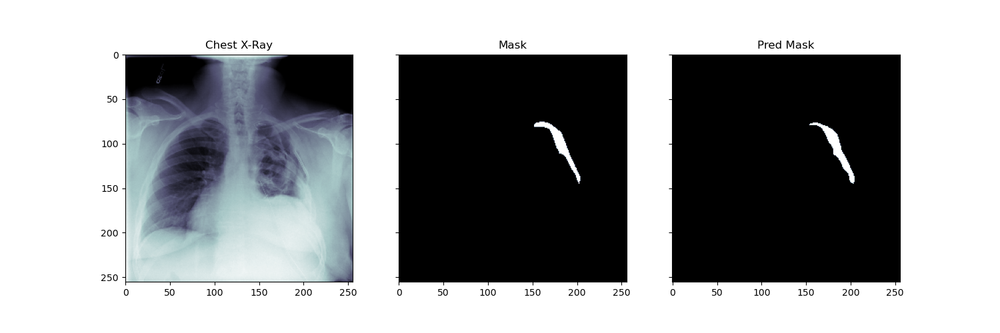

### Kaggle Page

All data and information regarding this project has been taken from the following Kaggle Competition

https://www.kaggle.com/c/siim-acr-pneumothorax-segmentation/overview/description


In [15]:
import inferenceHelpers as ih
import dataHelpers as dh
import plottingHelpers as ph
import testingHelpers as th
import importlib

In [2]:
# Create the data controller
# this will also prepare the 
# training and test data.
dc = dh.DataLoader()

Data Controller Created
	Loading training data...


  0%|                                                                                 | 4/3205 [00:00<01:21, 39.51it/s]

	Loading testing data...


100%|█████████████████████████████████████████████████████████████████████████████| 3205/3205 [00:30<00:00, 106.24it/s]


## Data Exploration

I have done some simple data exploration to begin this task to attain a better understanding of the underlying data. Having some simple plots of the data and the mask helped me attain a better intuitive understanding of the problem and what the solution looks like. I do not have a medical background so type of annotation applied to radiography images was new to me!


Plotting Helpers


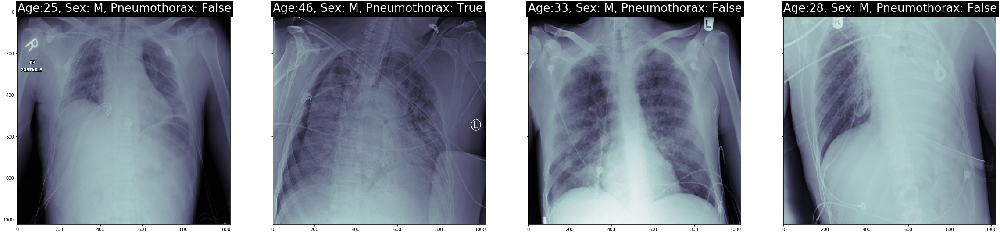

image id: 1.2.276.0.7230010.3.1.4.8323329.3789.1517875179.419895


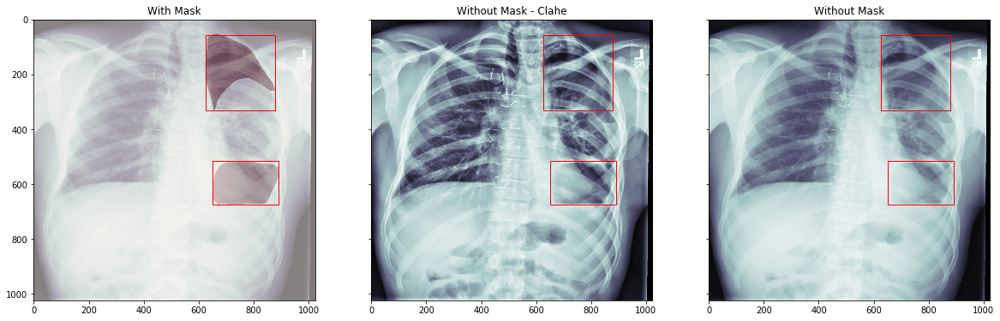

image id: 1.2.276.0.7230010.3.1.4.8323329.6903.1517875201.859612


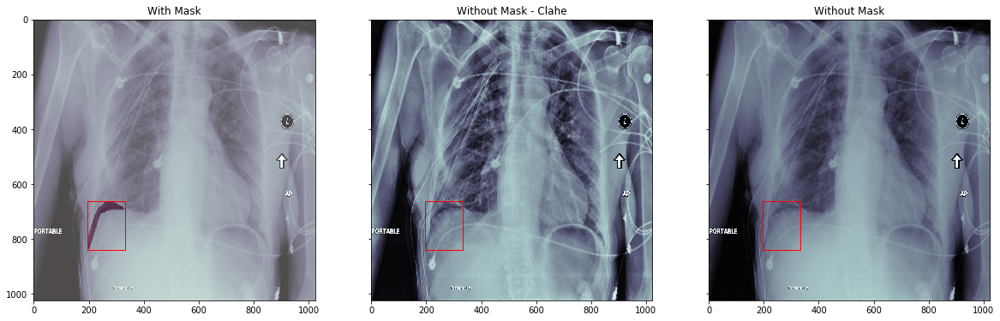

image id: 1.2.276.0.7230010.3.1.4.8323329.3700.1517875179.46189


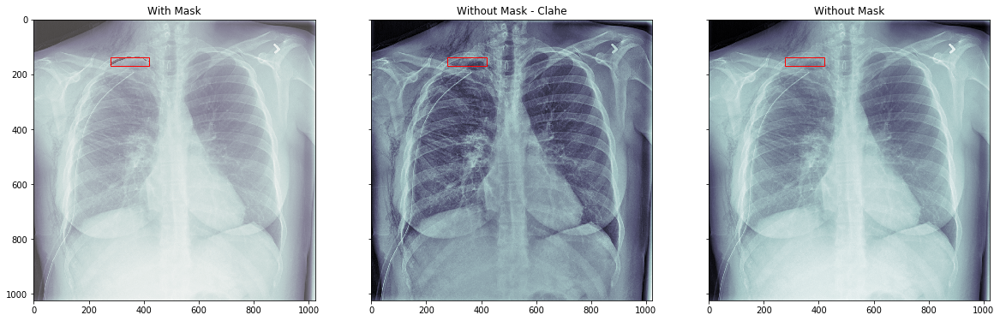

image id: 1.2.276.0.7230010.3.1.4.8323329.4294.1517875182.149482


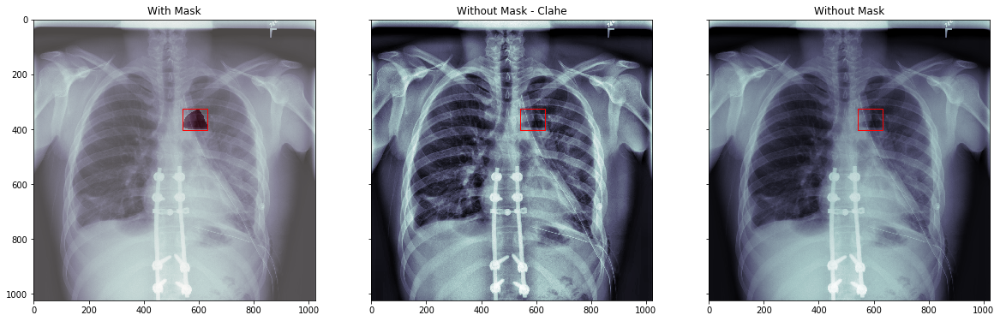

image id: 1.2.276.0.7230010.3.1.4.8323329.11314.1517875232.287707


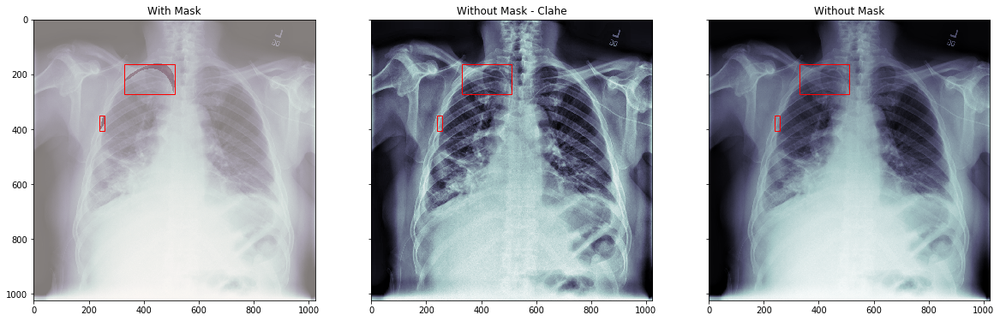

image id: 1.2.276.0.7230010.3.1.4.8323329.2579.1517875173.586381


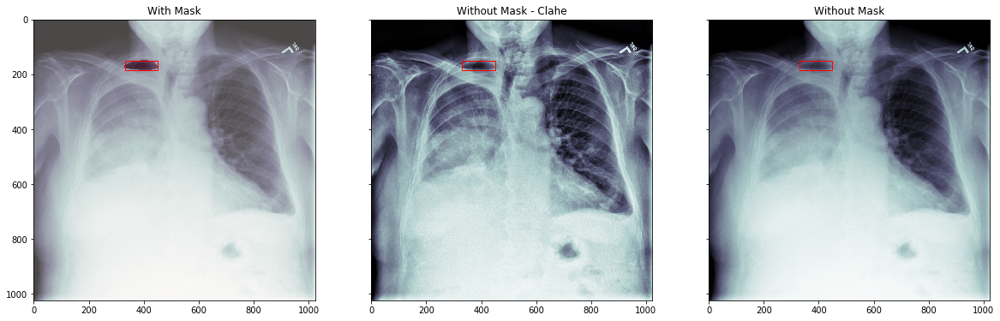

image id: 1.2.276.0.7230010.3.1.4.8323329.300.1517875162.258081


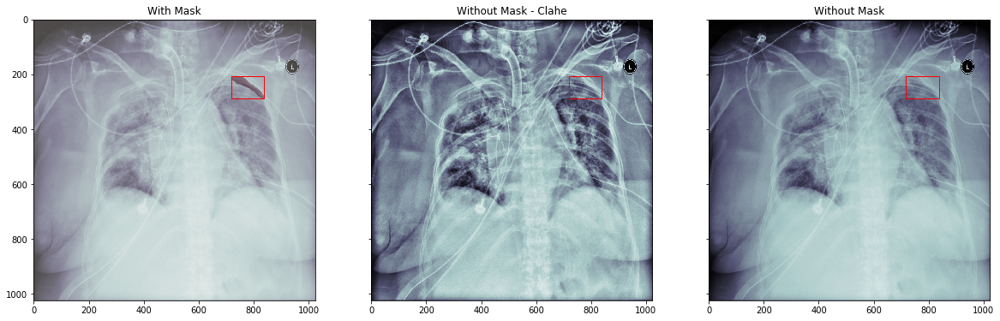

image id: 1.2.276.0.7230010.3.1.4.8323329.12896.1517875242.420356


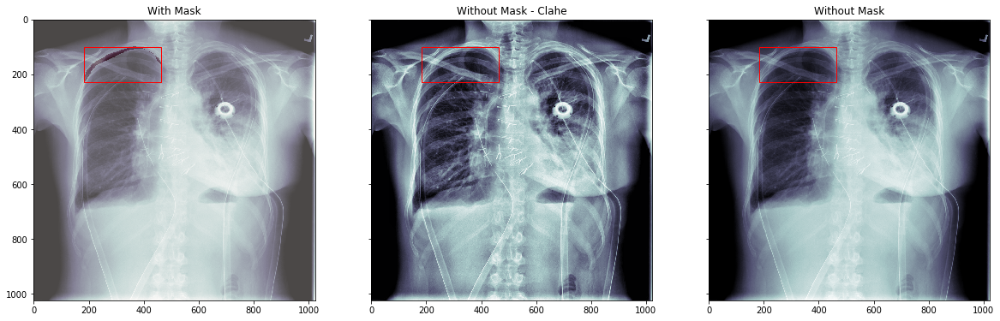

image id: 1.2.276.0.7230010.3.1.4.8323329.12969.1517875242.788276


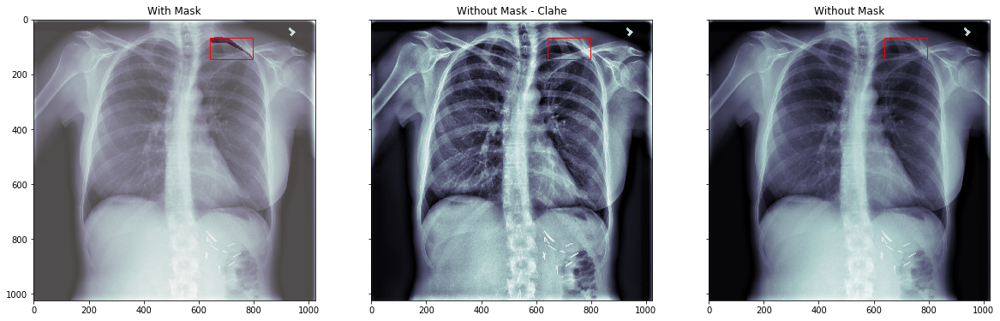

image id: 1.2.276.0.7230010.3.1.4.8323329.10265.1517875222.899187


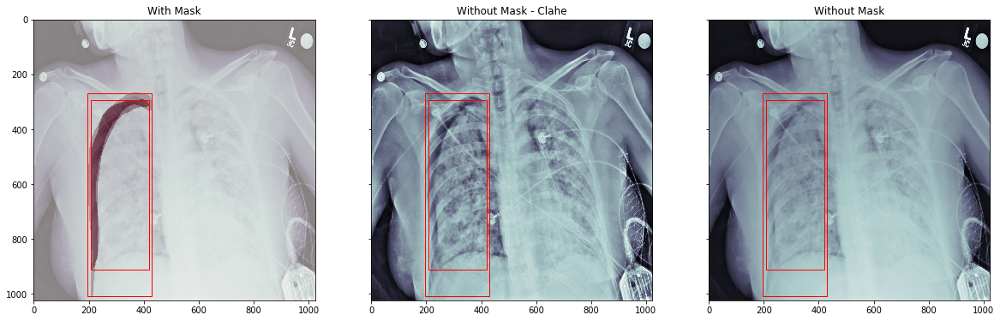

In [3]:
# Plotting Controller
pc = ph.PlottingController()
# Visualisations 
pc.plot_train_data(dc.train_data)
pc.plot_train_data_with_box(dc.train_data)

## Bias Analysis

### Diagnosis

Probably the most glaring imbalance is the ratio of data from patients that were diagnosed with Pneumothorax vs not diagnosed. I addressed this in my code by allowing a ratio to be specified for negative:positive diagnosis samples in the training data, for this submission the ratio was set to 1:1 and therefore a large amount of negative diagnosis data was dropped (at random).

### Age

There is a non-uniform distribution of samples across age, this could potentially lead to the algorithm become over-fitted for certain types of samples however I determined that this risk was negligible at this stage. One key thing that I could determine is that the mean age across the two classes (positive and negative diagnosis) seems to have a very similar mean value, which is valuable information as it would seem that there is no bias towards a particular age group.

### Sex

There are slightly more samples from Males than Females in this dataset however at this stage I also determined that this imbalance is not worth addressing but it is definitely something worth being mindful about for future revisions. When looking at the diagnosis charts vs sex it would also seem that the ratio of positive:negative diagnosis is very similar.


<Figure size 432x288 with 0 Axes>

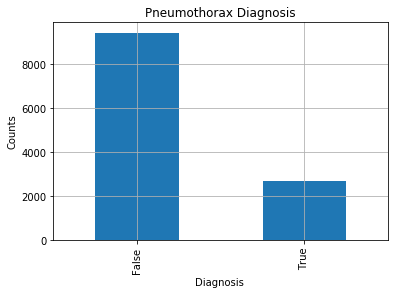

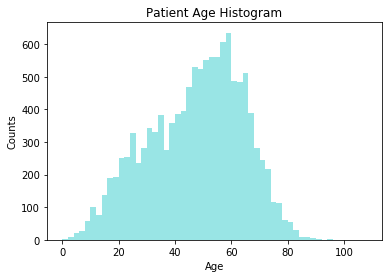

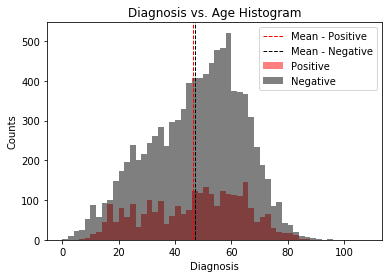

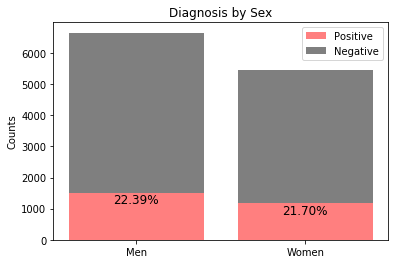

Total Number of Training Samples: 12089
Pneumothorax Positive count: 2669 -> 22.08%
Number of x-rays with missing labels: 42 -> 1.57%
Pneumothorax Negative count: 9420 -> 77.92


In [4]:
# Data Analysis
pc.data_analysis(dc.train_data)

In [5]:
img_size = 256
training_dg = dh.DataGenerator(dc.train_data, img_size)
# Take small % of the data for Visualisation Purposes
# TODO: Shouldn't be doing it like this, need to use
# all the data for training and use the internal val
# fold in tf train to assess results.
X_train, X_val = training_dg.splitSelectedData(0.01)


Negative Ratio: 1
Dropping 6709 of the Negative Class!



## Dataset Augmentation

Augmentation was applied heavily to help increase robustness as there is a relatively small amount of data in this dataset. More augmentation techniques could definitely be added to this repository, some ideas for additional augmentations: Zoom, Distortion, Blur. It could be beneficial to play around with Augmentation rates as well as the augmentation values, the augmentations at this stage are applied sequentially and there is a specified percentage chance defining whether or not a particular augmentation will be applied.

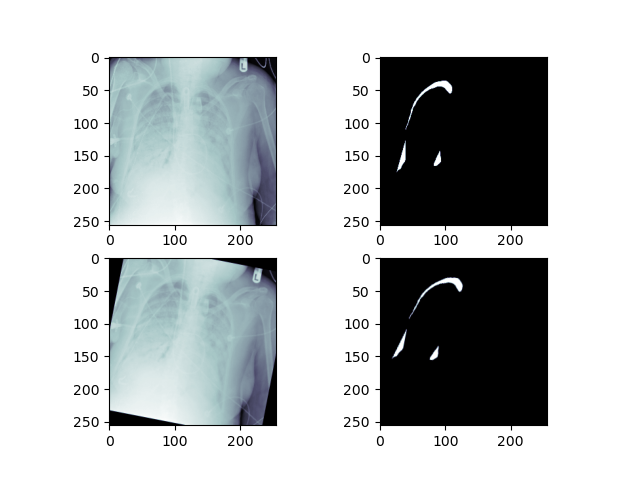
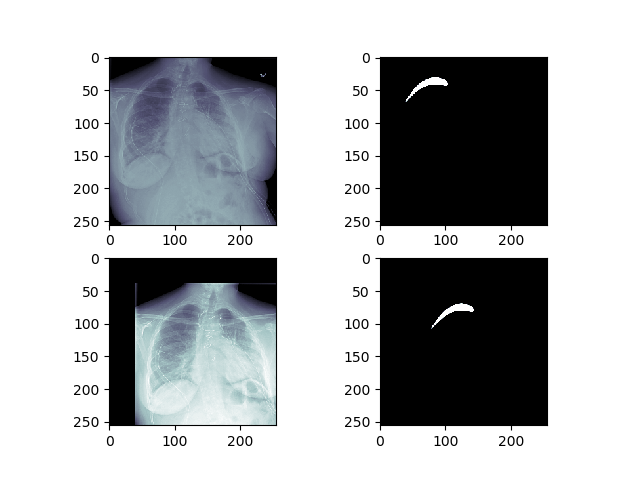
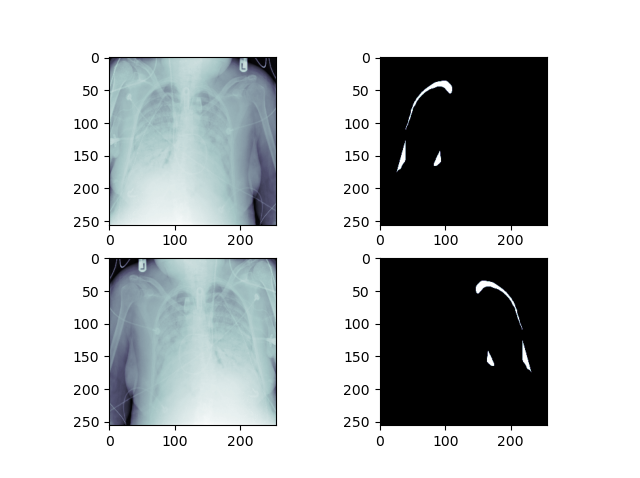
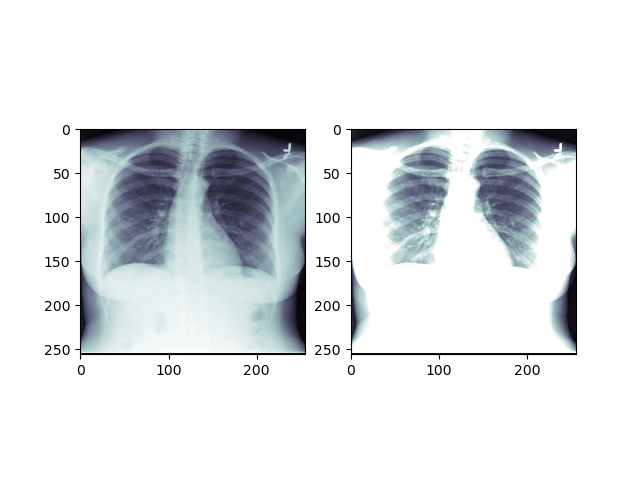

Some of the training images seem poor in quality (See annotation_examples/11.png), I have noticed multiple training images that look like this. One of the images was upside down (See prediction_examples/6.png). Augmentation should hopefully help with this, additional analysis of the rate of pneumo positive images that are distorted could be helpful. I have removed a small number of images that were flagged in training as Pneumo positive but do not have any annotation.

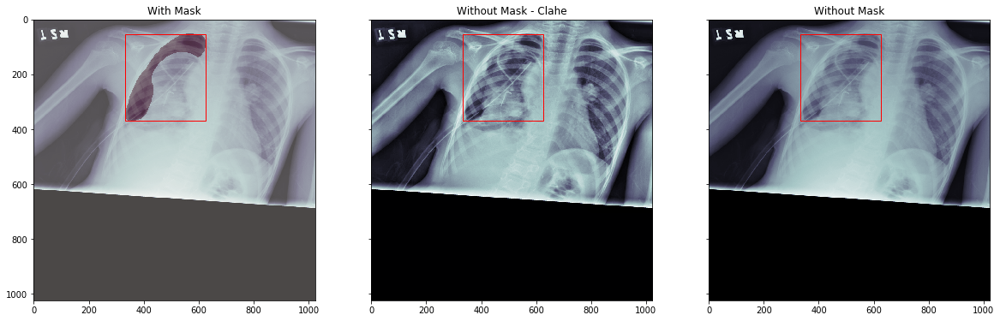
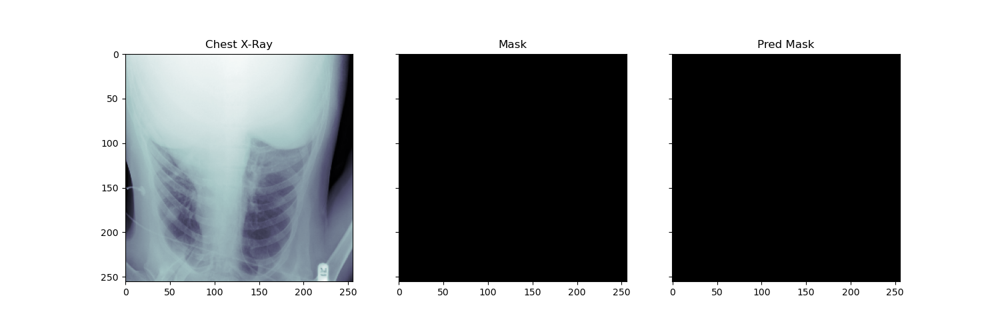

In [6]:
# Establish Model & Inference Controller 
ic = ih.InferenceController(img_size=img_size)

# Pick Dataset
dataset = X_train
#dataset = training_dg.selected_data['file_path'].values 
print("Training Data Length: {}".format(len(dataset)))

# Training Parameters
epochs = 100
augmentation_factor = 100
steps_per_epoch = (len(dataset)*augmentation_factor) // (training_dg.batch_size*epochs)

Training Data Length: 5284


## Inference

Res-U-Net is my architecture of choice. There are many other architectures which could also achieve great and potentially better results. It would definitely be beneficial to train multiple architectures in future and compare results from them.
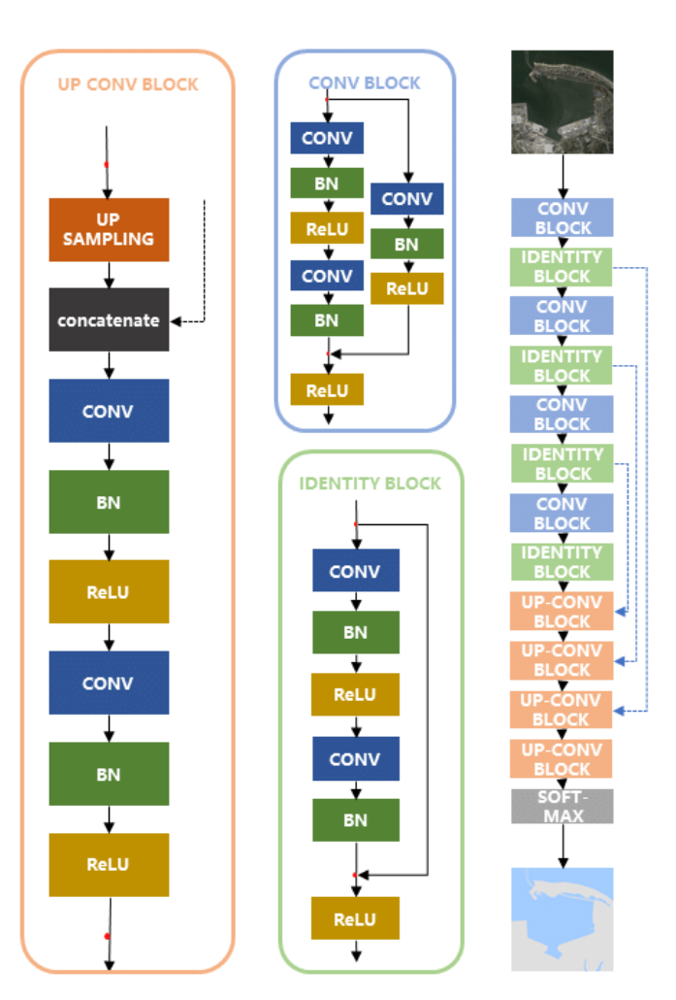

At this stage my loss function is very simple. I am using binary cross entropy and dice loss without any coefficients. It could be beneficial to play around with the loss function and use coefficients to balance the bce and dice loss as this would likely lead to better results. You can find the loss functions defined as below in the InferenceHelper class.

In [ ]:
""" Code Snipped Extracted from Inference Helper to make Notebook """

def dsc(y_true, y_pred):
    smooth = 1.
    y_true_f = Flatten()(y_true)
    y_pred_f = Flatten()(y_pred)
    intersection = reduce_sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (reduce_sum(y_true_f) + reduce_sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - self.dsc(y_true, y_pred)
    return loss

def bce_dice_loss(y_true, y_pred):
    """
    This competition is evaluated on the mean Dice coefficient. 
    The Dice coefficient can be used to compare the pixel-wise 
    agreement between a predicted segmentation and its 
    corresponding ground truth. 
    # https://www.kaggle.com/c/siim-acr-pneumothorax-segmentation/overview/evaluation
    """
    loss = binary_crossentropy(y_true, y_pred) + self.dice_loss(y_true, y_pred)
    return loss

In [7]:
# Train the Model
generator = training_dg.generateBatches(dataset, augmentation_factor)
model_path = ic.train(generator, epochs, steps_per_epoch)

# NOTE: The generator seems to be slowing things down, would be good to optimise it.


Length Total Data: 5284
Augmentation Factor: 100

Epoch 1/100
330/330 [==============================] - 200s 606ms/step - loss: 1.0231 - dsc: 0.0422
Epoch 2/100
330/330 [==============================] - 175s 530ms/step - loss: 0.9543 - dsc: 0.1022
Epoch 3/100
330/330 [==============================] - 184s 557ms/step - loss: 0.9240 - dsc: 0.1328
Epoch 4/100
330/330 [==============================] - 183s 554ms/step - loss: 0.9072 - dsc: 0.1490
Epoch 5/100
330/330 [==============================] - 195s 592ms/step - loss: 0.8914 - dsc: 0.1646
Epoch 6/100
330/330 [==============================] - 149s 453ms/step - loss: 0.8782 - dsc: 0.1765
Epoch 7/100
330/330 [==============================] - 166s 503ms/step - loss: 0.8624 - dsc: 0.1922
Epoch 8/100
330/330 [==============================] - 219s 664ms/step - loss: 0.8544 - dsc: 0.1994
Epoch 9/100
330/330 [==============================] - 215s 651ms/step - loss: 0.8375 - dsc: 0.2161
Epoch 10/100
330/330 [===========================

330/330 [==============================] - 153s 465ms/step - loss: 0.5301 - dsc: 0.5052
Epoch 80/100
330/330 [==============================] - 150s 454ms/step - loss: 0.5365 - dsc: 0.4989
Epoch 81/100
330/330 [==============================] - 150s 454ms/step - loss: 0.5326 - dsc: 0.5031
Epoch 82/100
330/330 [==============================] - 150s 455ms/step - loss: 0.5316 - dsc: 0.5035
Epoch 83/100
330/330 [==============================] - 156s 472ms/step - loss: 0.5298 - dsc: 0.5054
Epoch 84/100
330/330 [==============================] - 156s 473ms/step - loss: 0.5440 - dsc: 0.4919
Epoch 85/100
330/330 [==============================] - 158s 479ms/step - loss: 0.5349 - dsc: 0.5006
Epoch 86/100
330/330 [==============================] - 157s 474ms/step - loss: 0.5212 - dsc: 0.5134
Epoch 87/100
330/330 [==============================] - 155s 471ms/step - loss: 0.5201 - dsc: 0.5144
Epoch 88/100
330/330 [==============================] - 154s 467ms/step - loss: 0.5240 - dsc: 0.5107
Epo

## Post Processing

Simple post-processing was applied to remove small sections of labelled data as this would likely be incorrect. There seems to be similar ideas in other submissions, I utilised the morphology functions in the skimage repository to achieve this.

## Evaluation Metric Discussion

At this stage evaluation metrics after model development is the Dice Coefficient as is specified to be used in the competition guidelines. It could be useful to determine false-positive/negative rates of the Algorithm, the Dice Coefficient does not strongly represent these metrics. False positive/negative rates intuitively feel like an important metric to use when assessing medical algorithms/procedures.

Pixel Accuracy may be a relatively confusing metric due to the high class imbalance nature of this problem, Intersection over Union would have limited use in my opinion as they are positively correlated.

Images for Men and Women are substantially different, would be interesting to assess algorithm performance on metadata such as sex, age etc.

## Robust Evaluation

Currently I am just using the Dice Coefficient to measure performance against a fraction of the training data that has been isolated from the data used to train the model. It would be better to run training multiple times and assess the performance against multiple slices of the training data. 

In [ ]:
""" Code sample taken from Testing Helper Function for Notebook """

def dice_coefficient(true, pred):
    """ Simple function to calculate dice loss coefficient """
    # Dice Coefficient is 2 * the Area of Overlap divided by the total number of pixels in both images.
    true = np.asarray(true).astype(np.bool)
    pred = np.asarray(pred).astype(np.bool)
    if not (np.sum(true) + np.sum(pred)):
        return 1.0
    # NOTE: Could add smoothing
    return (2. * np.sum(true * pred)) / (np.sum(true) + np.sum(pred))

Directory ../models/2020-08-12_16-48-03\images already exists.

Length Total Data: 54
Augmentation Factor: 1



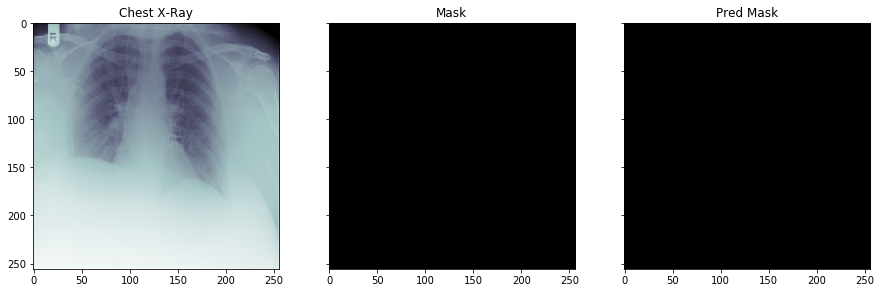

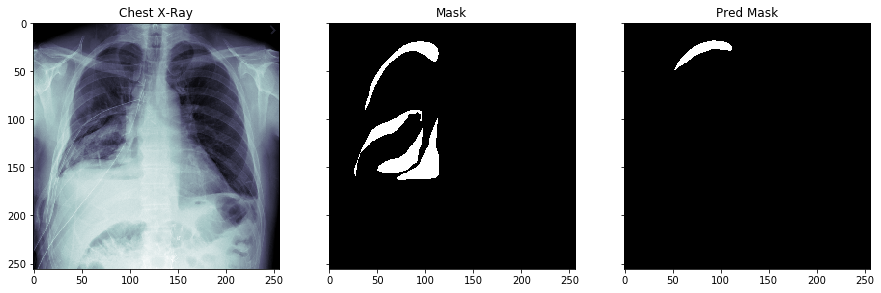

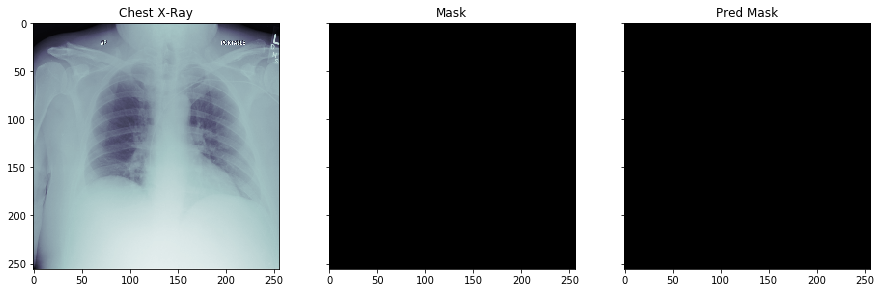

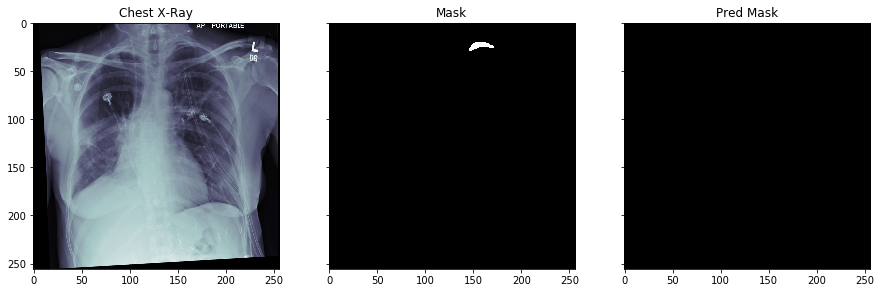

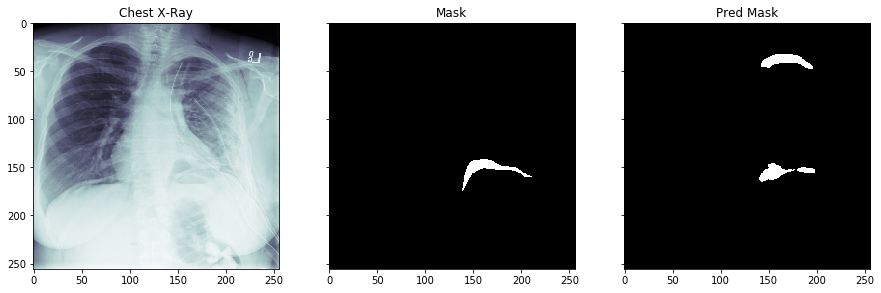

...

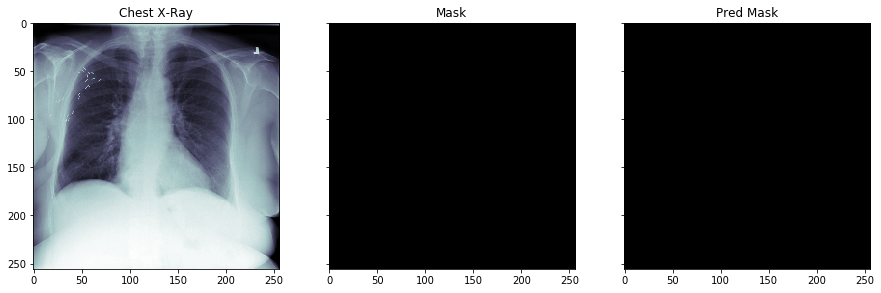

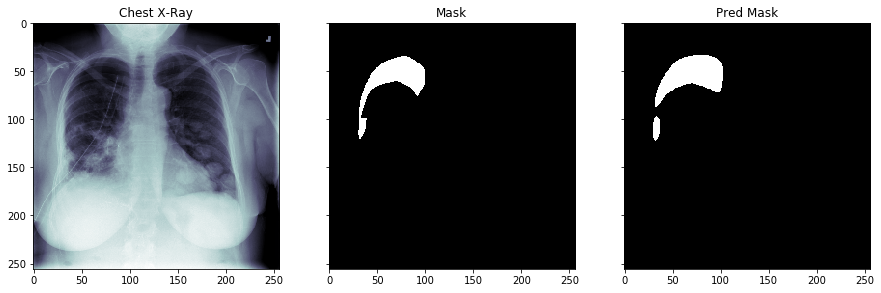

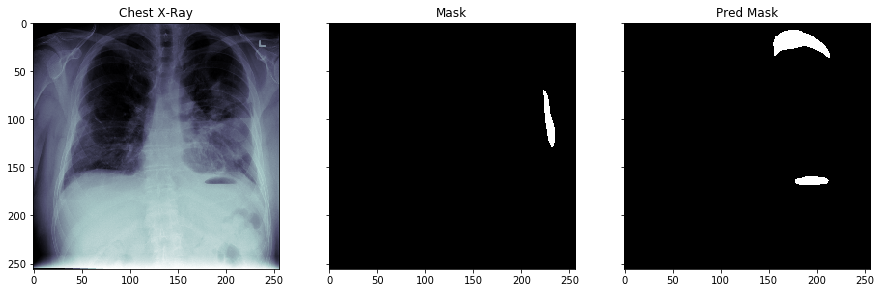

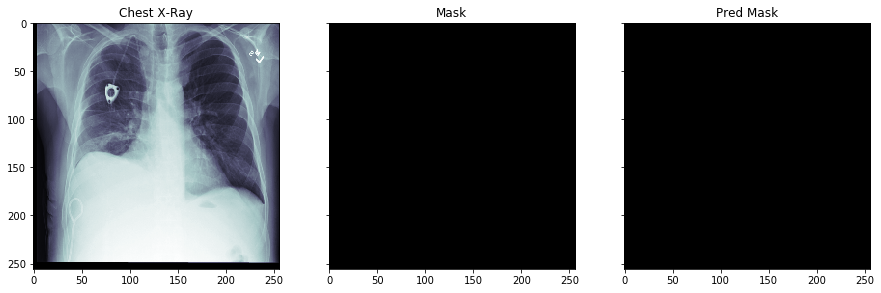

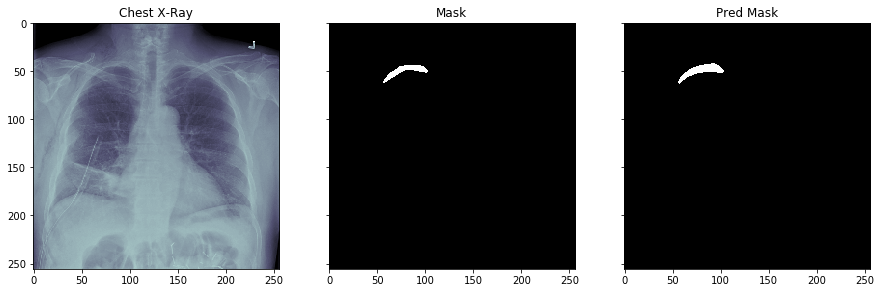

StopIteration: 

In [22]:
# Choose testing dataset 
# NOTE: This needs to be changed, not ideal
test_dataset = X_val

# Plotting some of the results from test dataset
th.plot_results(model_path, training_dg.generateBatches(test_dataset, augment_data=False), img_size, model_path)

In [20]:
# Analyse Results
importlib.reload(th)
th.analyse_model(model_path, training_dg.generateBatches(test_dataset, augment_data=False), img_size)


Length Total Data: 54
Augmentation Factor: 1


Mean Dice Coefficient: 0.61 from 48 test samples.
Mean Positive Dice Coeff: 0.36
Correct: 81.25, Incorrect: 18.75
False Positive: 6.25, False Negative: 12.50


In [19]:
# Create Submission
importlib.reload(th)
th.prepare_submission(model_path, dc.test_data, img_size)

Test Data: 3205
Submission Prepared!


## Conclusion

In conclusion this approach seems to achieve some success in detecting the presence of Pneumothorax. As discussed in further detail in the above sections, I believe there are many improvements that can be made to this approach. These improvements include:

- Different supervised learning architectures (EDANet, Mask-RCNN).
- Additional augmentation types (zoom, distortions, blur) and more aggressive augmentation.
- Loss function modifications, including coefficients to weight the bce & dice_loss functions.
- Using a separate algorithm to isolate the lung area in the images during pre-processing.
- Improving the post-processing routines.
- Addtitional data analysis and ensuring the input dataset is of good quality.
- More holistic evaluation metrics if this work was to be deployed.
- Analysing performance with respect to underlying metadata (age, patient sex, etc).
- Use of training data could be more efficient, making a val split for internal testing is not neccesary.

## Ideas

Supervised learning isn't the only viable approach to this problem. 

https://openreview.net/pdf?id=SkgC6TNFvr

RL for Semantic Segmentation - This concept is postulated to be more sample efficient, which may make some intuitive sense as it doesn't need to reconstruct the mask image (F(x) = y) but instead chooses actions (P(y|x)), could be interesting to try.